# Derive cancer and stroma masks in Xenium data

In [1]:
%load_ext autoreload

import os 
import sys
import time
import logging
import re
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from natsort import natsorted

import cv2
import numpy as np
from PIL import Image
import tifffile as tiff
import copy 

sys.path.append(os.path.dirname(os.getcwd()))

from src import get_arrays as ga
from src import contours 
from src import masks
from src.mask_properties import GetMasksProperties

In [2]:
# define the logger :  can be None, and is set to INFO
# Custom logger setup
logger = logging.getLogger('contour_logger')
handler = logging.StreamHandler()
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)
logger.setLevel(logging.INFO)

# Xenium Data

Resolution
1 px = 1um

Transcripts -> 499 + system and negative controls

custom made panel

CRC cohort

In [4]:
xenium_path =  '../../xenium_data/HLA/GD_TMA1_S3/fov_filtered'

to_exclude = [
    'TMA1_Selection14_filtered.csv' , # little tumour
    'TMA1_Selection15_filtered.csv', # tonsil
    'TMA1_Selection18_filtered.csv' , # normal
    'TMA1_Selection24_filtered.csv', # tonsl 
    'TMA1_Selection27_filtered.csv', # low quality
    'TMA1_Selection32_filtered.csv', # low quality
    'TMA1_Selection33_filtered.csv', # low quality
             ]
files_tma1 = os.listdir(xenium_path)
# Adding the full path to each file
files_names = [os.path.join(xenium_path, file) for file in files_tma1 if file not in to_exclude]
files_xenium = copy.deepcopy(files_names)
print(len(files_names))

20


Let's open one file to see how it looks like. Negative probes and controls have been removed

In [5]:
file_csv = files_names[0]   # 5
df_total = pd.read_csv(file_csv)
df_total = df_total[['x_location', 'y_location', 'feature_name']]
df_total = df_total.rename(columns={'feature_name': 'target'})
df_total = df_total[~df_total['target'].str.contains('System|egative')]
df_total['X'] = df_total['x_location'] - min(df_total['x_location'])
df_total['Y'] = df_total['y_location'] - min(df_total['y_location'])

n_genes = len(df_total['target'].unique())
height = int(max(df_total['X'])) + 1
width = int(max(df_total['Y'])) + 1

print(f'n genes: {n_genes}')
print(f'shape: {height}, {width}')
print(f'n hits {len(df_total)}')

n genes: 480
shape: 1888, 1801
n hits 3299650


Define GRIDGEN parameters and obtain arrays. 

This part is similar to CosMx. The parameters need ot be adjusted accordingly to the data characteristics. 

Contours designed:

    - Contours for the cancer regions using the cancer trasncripts.
    - Contours around the regions that have tissue (emptiness) using all the transcripts available.
    
We will plot the results with the graphics available in GRIDGEN:

    - contours scatter - where each transcript point of that region is blue and the contour is red.
    - conv sum - plot with the convolutional sum image ( densities on each kernel).
    
    
Next we will trasnform the contours into masks. 
Cancer masks will be equivalent to the cancer contours. Stroma masks will be the total tissue contours without the cancer areas.

Some operations can be done to get smoother masks. In the example below, holes in tumour masks are filled. This is optional. 


we wrap the pipeline in a function and apply it to the full cohort.

In [5]:
# defined with the gene list f
target_tum = ['EPCAM', 'SMIM22','CLDN3', 'KRT18','LGALS4', 'KRT8', 'ELF3','TSPAN8', 'STMN1', 'CD47', 'MYC', 'LGALS3'] 

# param tum
density_th_tum = 20    # 50
min_area_th_tum =  700 #1000     check how much is a cell 
kernel_size_tum = 10   # 20

# param empty
density_th_empty = 30
min_area_th_empty = 400 #400
kernel_size_empty = 10

In [9]:
def do_xenium_all(file_csv):
    df_total = pd.read_csv(file_csv)
    df_total = df_total[['x_location', 'y_location', 'feature_name']]
    df_total = df_total.rename(columns={'feature_name': 'target'})
    df_total = df_total[~df_total['target'].str.contains('System|egative')]
    df_total['X'] = df_total['x_location'] - min(df_total['x_location'])
    df_total['Y'] = df_total['y_location'] - min(df_total['y_location'])
    
    n_genes = len(df_total['target'].unique())
    height = int(max(df_total['X'])) + 1
    width = int(max(df_total['Y'])) + 1
    print(f"shape array: ({height}, {width}, {n_genes})")
    print("number of transcripts:", df_total.shape[0])
    # this makes the sparse df to an array with the spatial information 
    target_dict_total = {target: index for index, target in enumerate(df_total['target'].unique())}
    array_total = ga.transform_df_to_array(df = df_total, target_dict=target_dict_total, array_shape = (height, width,len(target_dict_total))).astype(np.int8)
    
    # creating subsets 
    df_subset_tum, array_subset_tum, target_indices_subset_tum = ga.get_subset_arrays(df_total, array_total,target_dict_total,
                                                                         target_list=target_tum, target_col = 'target')
    
# obtain contours 
    CTum = contours.ConvolutionContours(array_subset_tum, contour_name='tum')
    CTum.get_conv_sum(kernel_size=kernel_size_tum, kernel_shape='square')
    CTum.contours_from_sum(density_threshold = density_th_tum,
                           min_area_threshold = min_area_th_tum , directionality = 'higher')
    
    CEmpty = contours.ConvolutionContours(array_total, contour_name='empty')
    CEmpty.get_conv_sum(kernel_size=kernel_size_empty, kernel_shape='square')
    CEmpty.contours_from_sum(density_threshold = density_th_empty,
                           min_area_threshold = min_area_th_empty, directionality = 'lower') # attention that directionality is lower here 
    
    # PLOTs -- instead of plotting just with the function for example: CTum.plot_contours_scatter, we will make a composite image 
    
#     fig, axs = plt.subplots(1, 2, figsize=(8,4))
#     CTum.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
#                                c_points= 'blue',c_contours= 'red', ax=axs[0])
#     axs[0].set_title('Tum points and tum contours')  
    
    
#     CEmpty.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
#                                c_points= 'blue',c_contours= 'red', ax=axs[1])
#     axs[0].set_title('total points and contours for empty')  
#     plt.subplots_adjust(wspace=0.02)  # Adjust to your preference
    
#     plt.show()
       
    
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))
    
    CTum.plot_conv_sum(cmap='plasma', c_countour='white', ax=axs[0])
    axs[0].set_title('Tum points and tum contours')
    
    CEmpty.plot_conv_sum(cmap='plasma', c_countour='white', ax=axs[1])
    axs[1].set_title('total points and contours for empty')
    
    plt.show()
    
    #### obtain masks
    GM = masks.GetMasks(image_shape = (height, width))
    
    mask_empty = GM.create_mask(CEmpty.contours)
    mask_tum = GM.create_mask(CTum.contours)
    mask_tum = GM.fill_holes(mask_tum)
    mask_stroma = GM.subtract_masks(np.ones((height, width), dtype=np.uint8), mask_tum, mask_empty)          
    mask_stroma = GM.filter_mask_by_area(mask_stroma, min_area=700)
    
    # general masks 
    GM.mask_S = mask_stroma
    GM.mask_T = mask_tum
    
    GM.plot_masks(masks=[GM.mask_S, GM.mask_T], mask_names=['Stroma', 'Tumour'],
                  background_color=(1, 1, 1), mask_colors={'Stroma': (65, 105, 225), 'Tumour': (255, 165, 0)},
                  path=None, show=True, ax=None, figsize=(6, 4))
    return GM


  0%|                                                                                                                                                        | 0/20 [00:00<?, ?it/s]

shape array: (1888, 1801, 480)
number of transcripts: 3299650
Function 'get_conv_sum' took 0.0800 seconds to execute.
Function 'contours_from_sum' took 4.0038 seconds to execute.
Function 'get_conv_sum' took 0.6368 seconds to execute.
Function 'contours_from_sum' took 4.7085 seconds to execute.


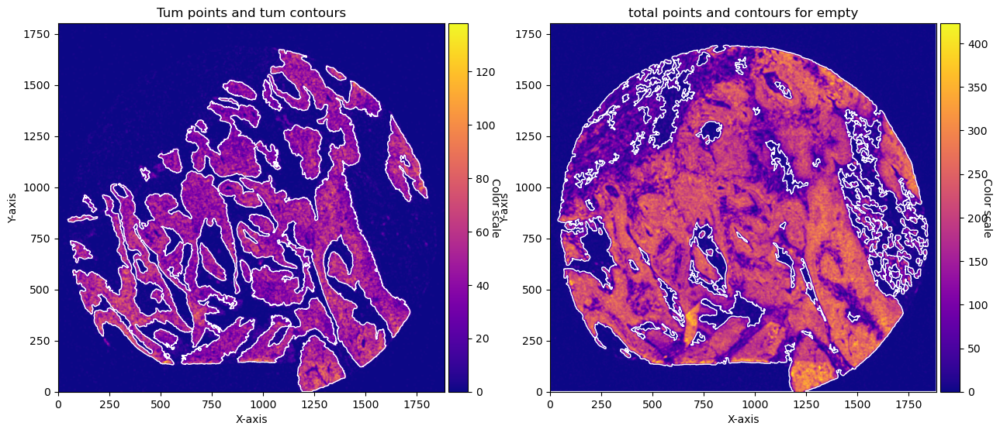

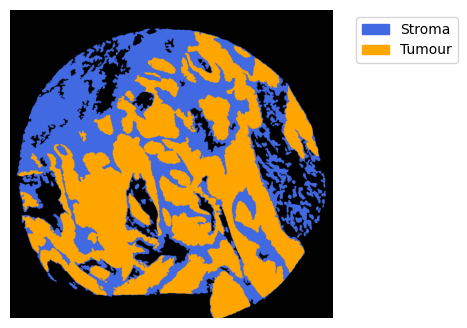

  5%|███████▏                                                                                                                                        | 1/20 [00:15<04:46, 15.06s/it]

shape array: (1777, 1919, 480)
number of transcripts: 3716715
Function 'get_conv_sum' took 0.0821 seconds to execute.
Function 'contours_from_sum' took 2.8531 seconds to execute.
Function 'get_conv_sum' took 0.5983 seconds to execute.
Function 'contours_from_sum' took 4.3207 seconds to execute.


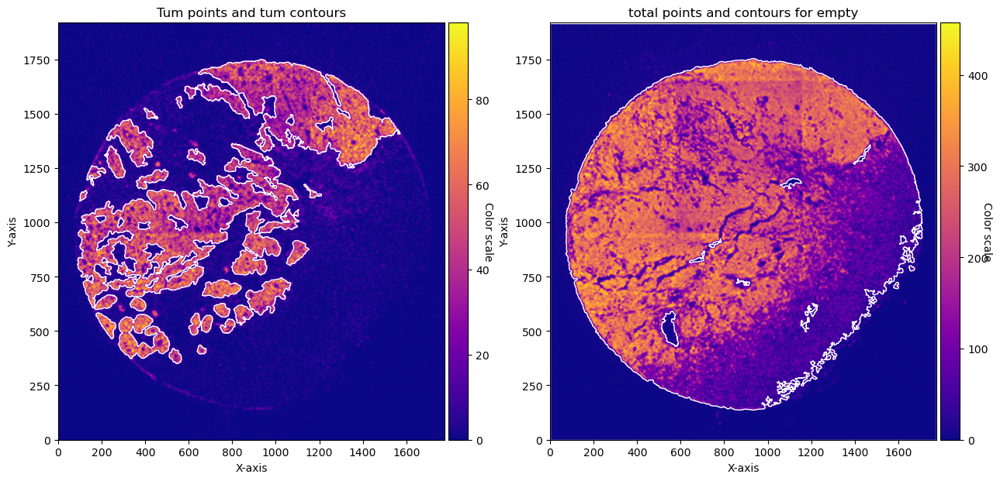

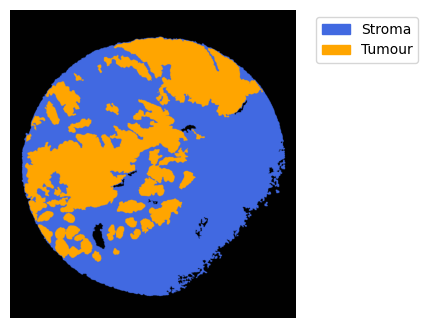

 10%|██████████████▍                                                                                                                                 | 2/20 [00:29<04:20, 14.49s/it]

shape array: (1730, 1659, 480)
number of transcripts: 2181492
Function 'get_conv_sum' took 0.0692 seconds to execute.
Function 'contours_from_sum' took 0.2893 seconds to execute.
Function 'get_conv_sum' took 0.4906 seconds to execute.
Function 'contours_from_sum' took 4.7191 seconds to execute.


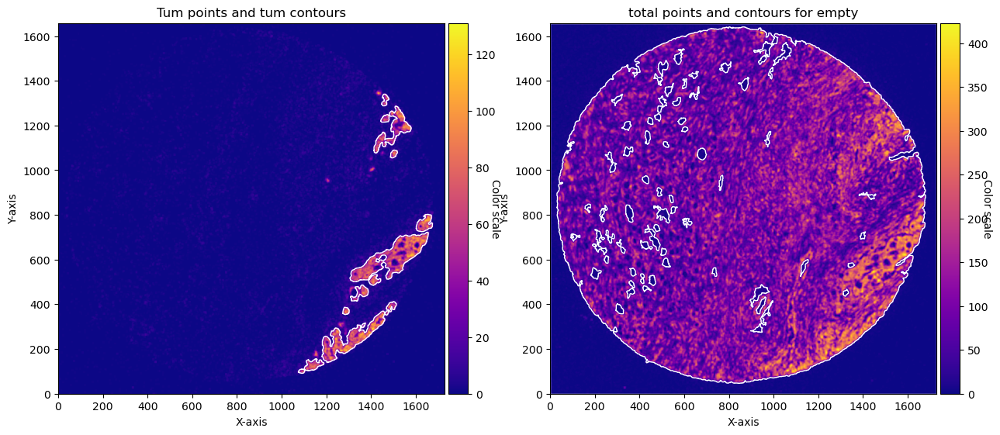

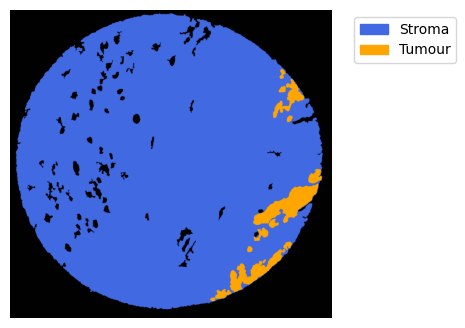

 15%|█████████████████████▌                                                                                                                          | 3/20 [00:38<03:29, 12.30s/it]

shape array: (1646, 1619, 479)
number of transcripts: 1663749
Function 'get_conv_sum' took 0.0623 seconds to execute.
Function 'contours_from_sum' took 0.5044 seconds to execute.
Function 'get_conv_sum' took 0.5299 seconds to execute.
Function 'contours_from_sum' took 0.7701 seconds to execute.


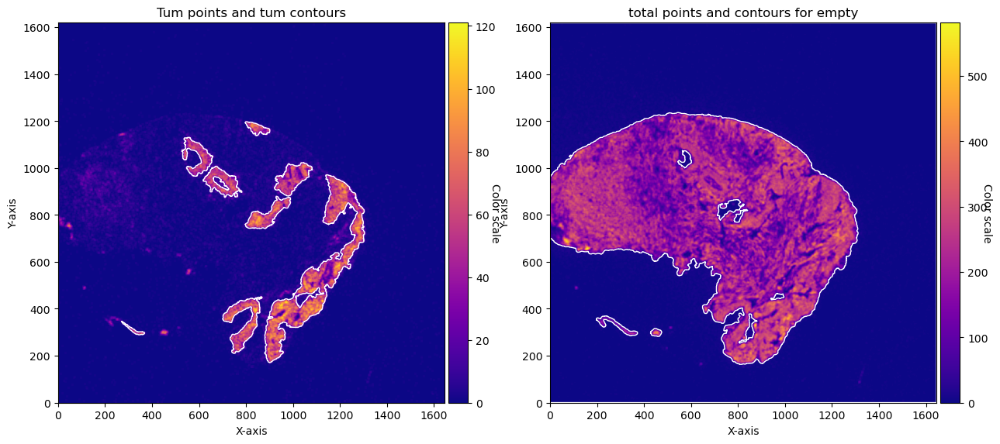

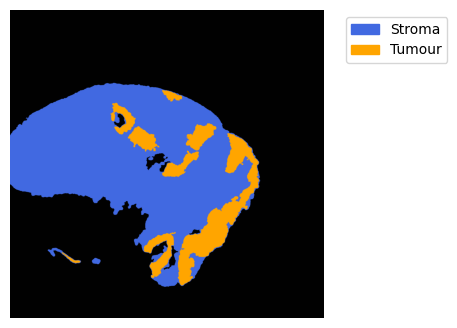

 20%|████████████████████████████▊                                                                                                                   | 4/20 [00:43<02:31,  9.46s/it]

shape array: (1809, 1809, 480)
number of transcripts: 2491593
Function 'get_conv_sum' took 0.0805 seconds to execute.
Function 'contours_from_sum' took 0.4619 seconds to execute.
Function 'get_conv_sum' took 0.6642 seconds to execute.
Function 'contours_from_sum' took 5.7884 seconds to execute.


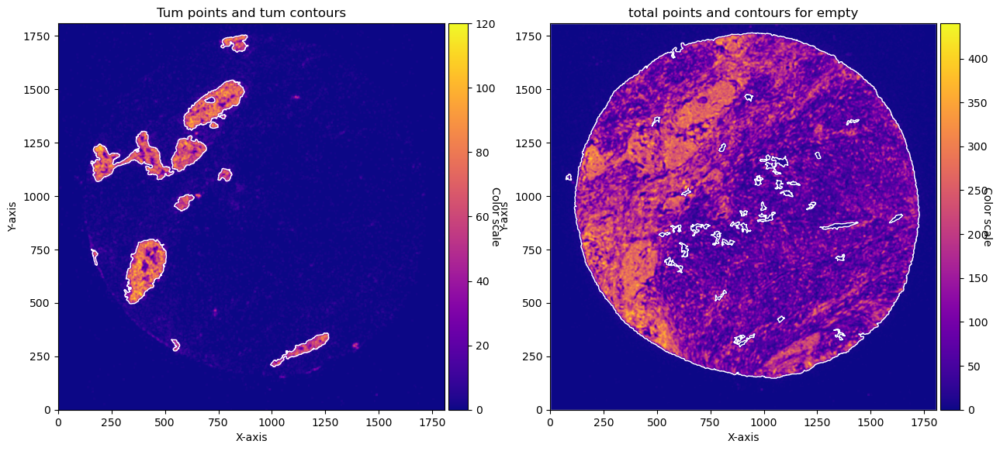

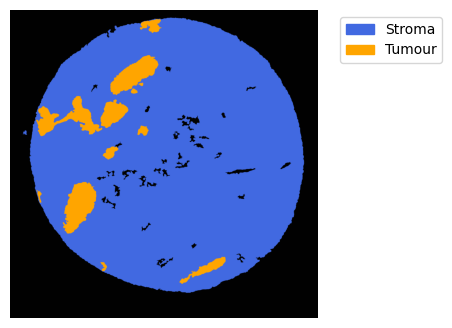

 25%|████████████████████████████████████                                                                                                            | 5/20 [00:55<02:32, 10.20s/it]

shape array: (1833, 1871, 480)
number of transcripts: 5055906
Function 'get_conv_sum' took 0.0838 seconds to execute.
Function 'contours_from_sum' took 9.1678 seconds to execute.
Function 'get_conv_sum' took 0.6099 seconds to execute.
Function 'contours_from_sum' took 0.9627 seconds to execute.


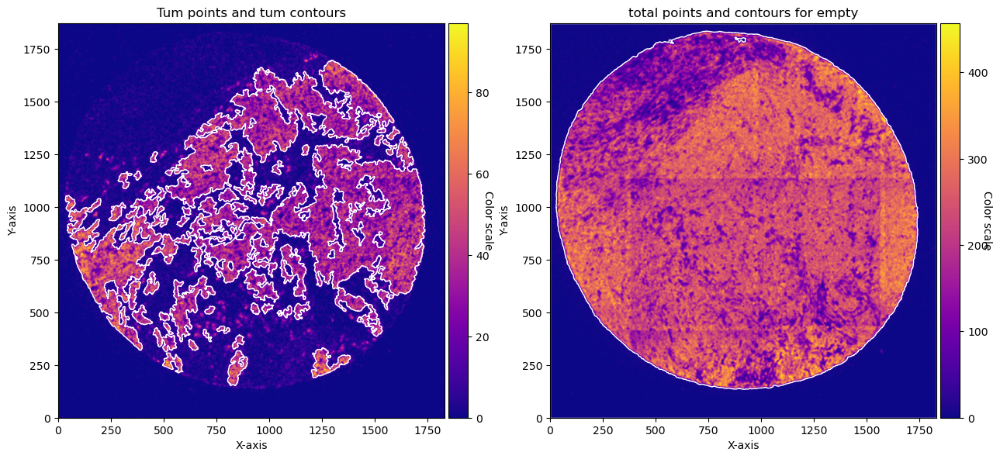

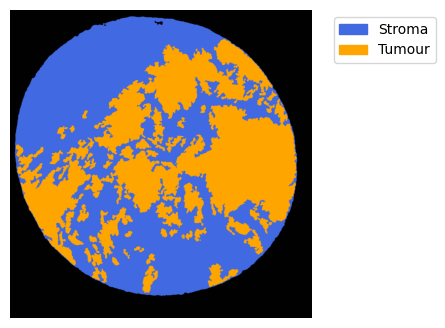

 30%|███████████████████████████████████████████▏                                                                                                    | 6/20 [01:14<03:03, 13.11s/it]

shape array: (1935, 1785, 480)
number of transcripts: 4210232
Function 'get_conv_sum' took 0.0819 seconds to execute.
Function 'contours_from_sum' took 2.8182 seconds to execute.
Function 'get_conv_sum' took 0.6959 seconds to execute.
Function 'contours_from_sum' took 1.3147 seconds to execute.


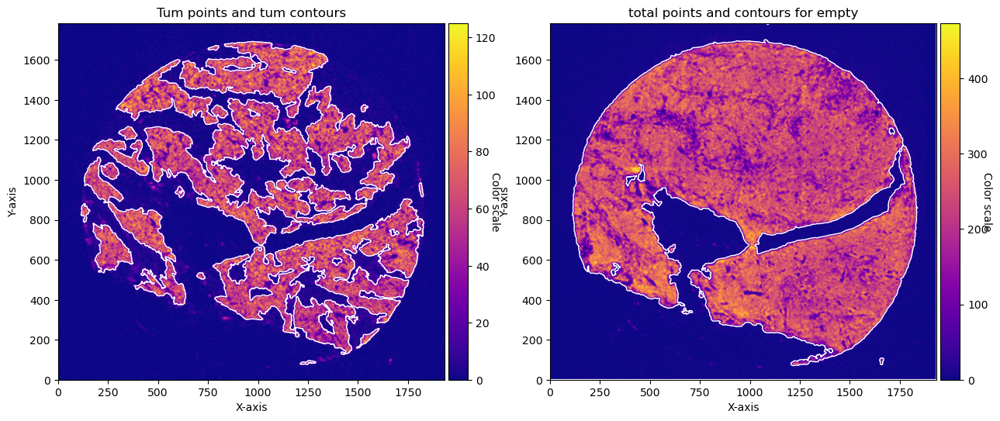

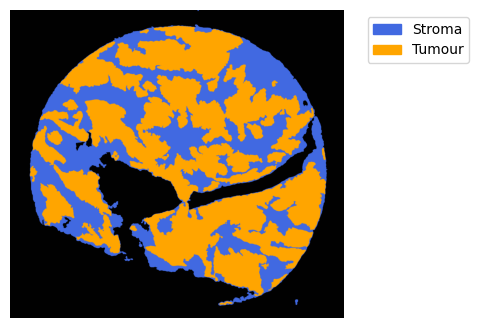

 35%|██████████████████████████████████████████████████▍                                                                                             | 7/20 [01:26<02:45, 12.71s/it]

shape array: (1809, 1769, 480)
number of transcripts: 4433228
Function 'get_conv_sum' took 0.0762 seconds to execute.
Function 'contours_from_sum' took 1.8036 seconds to execute.
Function 'get_conv_sum' took 0.5670 seconds to execute.
Function 'contours_from_sum' took 1.4066 seconds to execute.


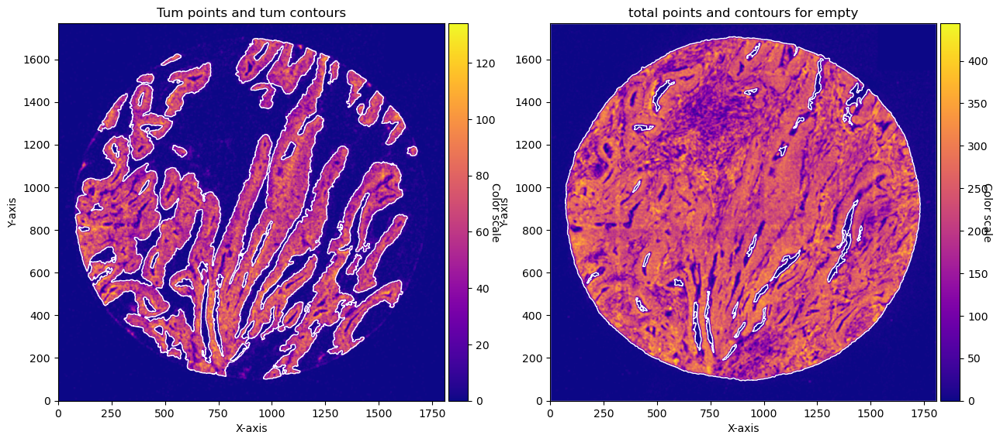

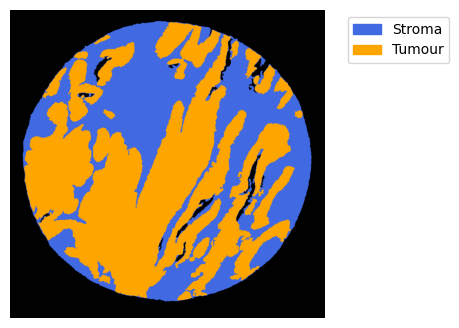

 40%|█████████████████████████████████████████████████████████▌                                                                                      | 8/20 [01:37<02:26, 12.17s/it]

shape array: (1864, 1817, 480)
number of transcripts: 3753386
Function 'get_conv_sum' took 0.0833 seconds to execute.
Function 'contours_from_sum' took 0.8140 seconds to execute.
Function 'get_conv_sum' took 0.6002 seconds to execute.
Function 'contours_from_sum' took 1.5355 seconds to execute.


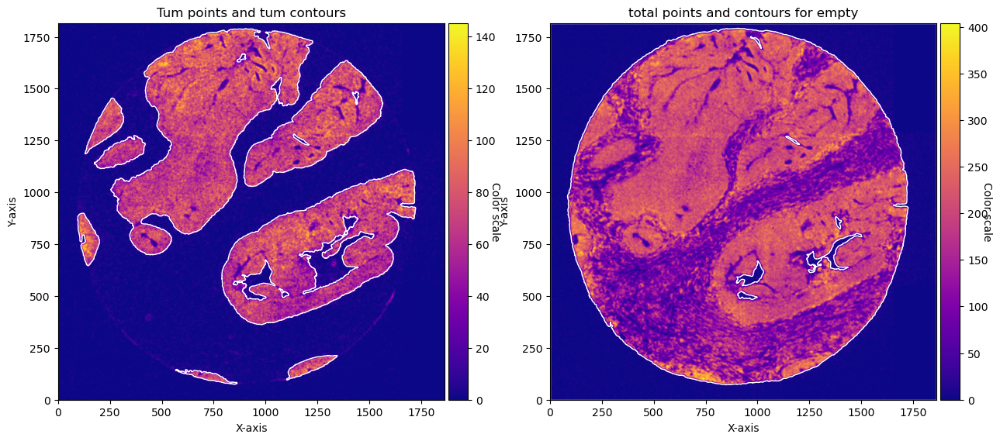

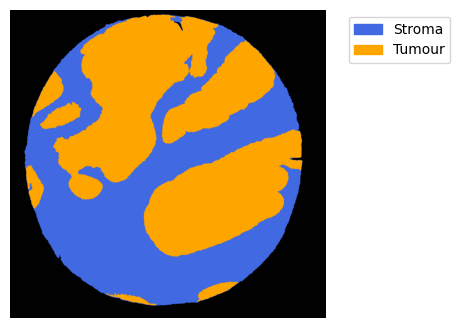

 45%|████████████████████████████████████████████████████████████████▊                                                                               | 9/20 [01:46<02:04, 11.29s/it]

shape array: (1817, 1817, 480)
number of transcripts: 2084362
Function 'get_conv_sum' took 0.0807 seconds to execute.
Function 'contours_from_sum' took 0.3528 seconds to execute.
Function 'get_conv_sum' took 0.5807 seconds to execute.
Function 'contours_from_sum' took 2.4814 seconds to execute.


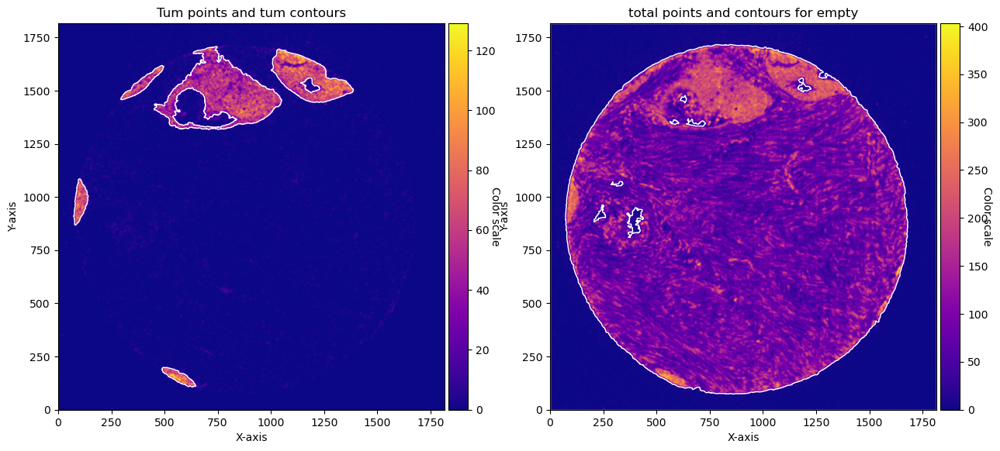

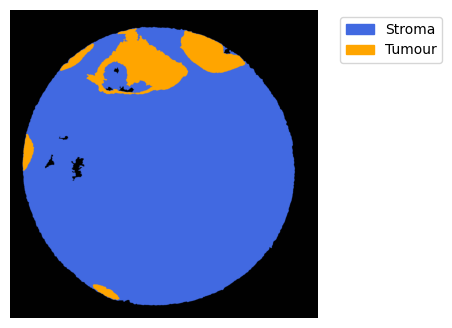

 50%|███████████████████████████████████████████████████████████████████████▌                                                                       | 10/20 [01:53<01:41, 10.10s/it]

shape array: (1521, 1675, 480)
number of transcripts: 2773943
Function 'get_conv_sum' took 0.0613 seconds to execute.
Function 'contours_from_sum' took 1.0570 seconds to execute.
Function 'get_conv_sum' took 0.5329 seconds to execute.
Function 'contours_from_sum' took 1.3863 seconds to execute.


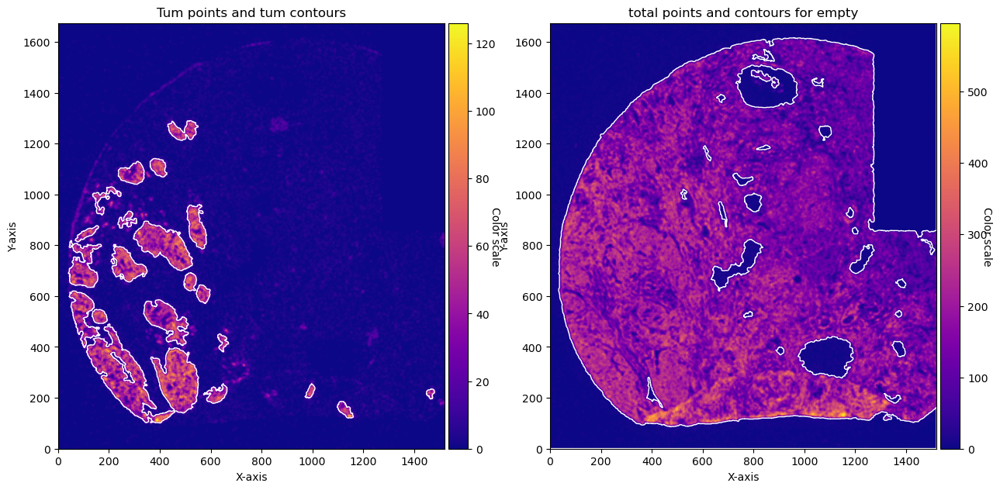

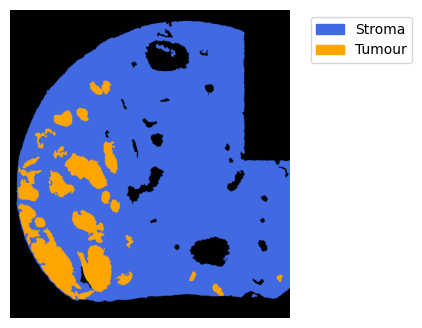

 55%|██████████████████████████████████████████████████████████████████████████████▋                                                                | 11/20 [02:01<01:24,  9.39s/it]

shape array: (1566, 1525, 479)
number of transcripts: 3401574
Function 'get_conv_sum' took 0.0571 seconds to execute.
Function 'contours_from_sum' took 1.7243 seconds to execute.
Function 'get_conv_sum' took 0.4941 seconds to execute.
Function 'contours_from_sum' took 1.1958 seconds to execute.


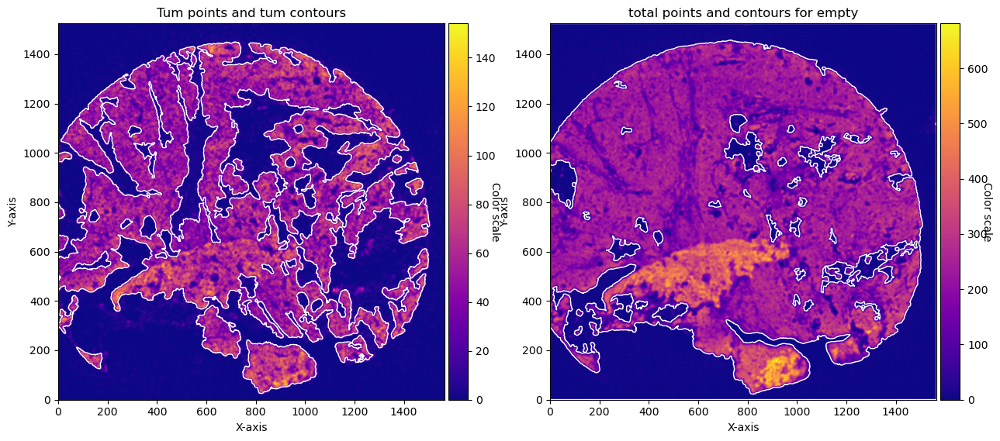

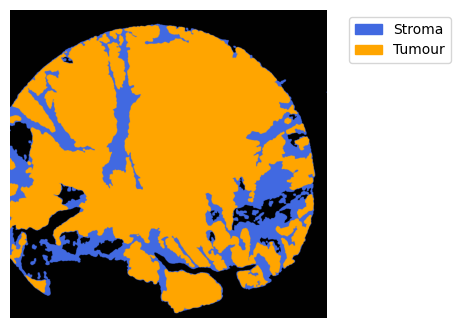

 60%|█████████████████████████████████████████████████████████████████████████████████████▊                                                         | 12/20 [02:10<01:14,  9.27s/it]

shape array: (1746, 1651, 480)
number of transcripts: 2902610
Function 'get_conv_sum' took 0.0675 seconds to execute.
Function 'contours_from_sum' took 0.2722 seconds to execute.
Function 'get_conv_sum' took 0.5438 seconds to execute.
Function 'contours_from_sum' took 2.1631 seconds to execute.


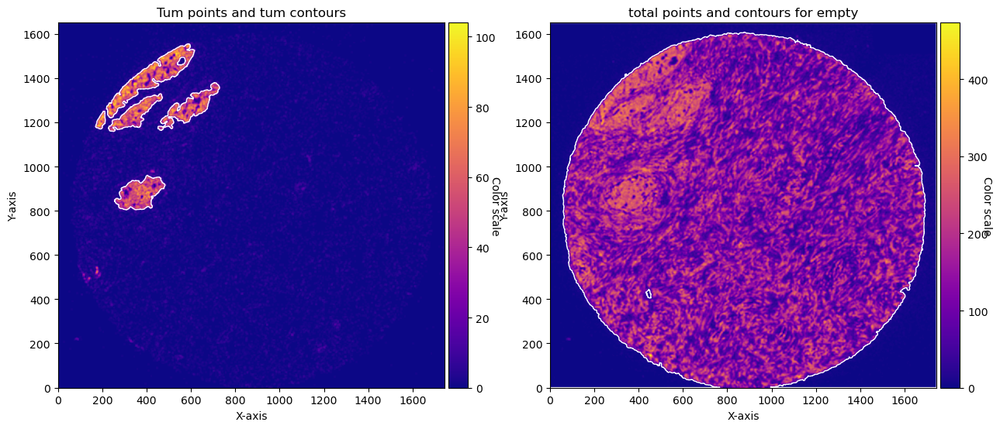

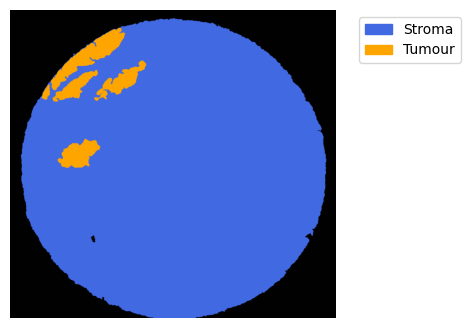

 65%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 13/20 [02:18<01:02,  8.91s/it]

shape array: (1690, 1675, 480)
number of transcripts: 2077338
Function 'get_conv_sum' took 0.0664 seconds to execute.
Function 'contours_from_sum' took 4.1856 seconds to execute.
Function 'get_conv_sum' took 0.5878 seconds to execute.
Function 'contours_from_sum' took 4.1059 seconds to execute.


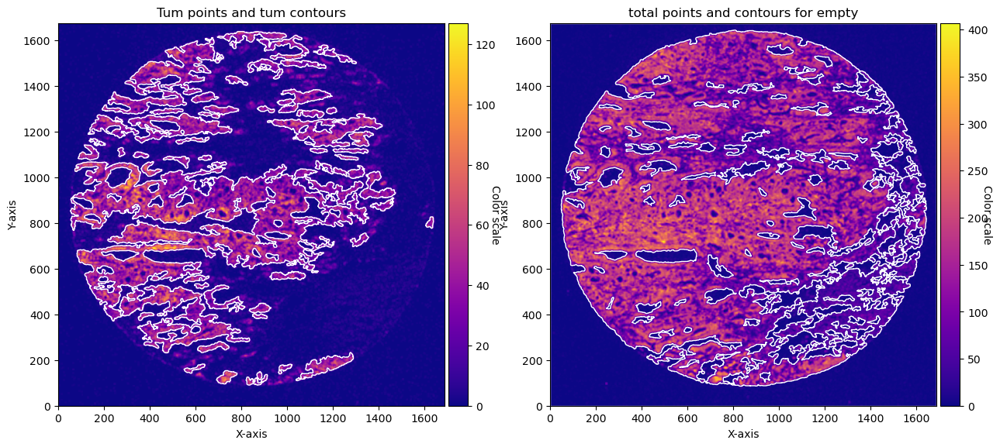

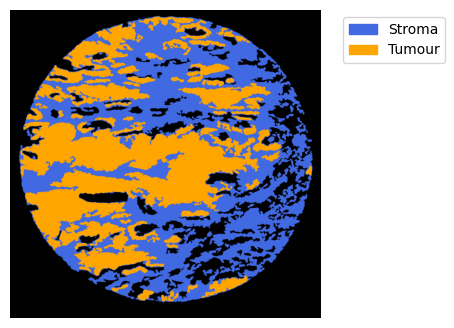

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 14/20 [02:31<01:00, 10.14s/it]

shape array: (1793, 1888, 479)
number of transcripts: 4100005
Function 'get_conv_sum' took 0.0839 seconds to execute.
Function 'contours_from_sum' took 0.7778 seconds to execute.
Function 'get_conv_sum' took 0.6893 seconds to execute.
Function 'contours_from_sum' took 1.2959 seconds to execute.


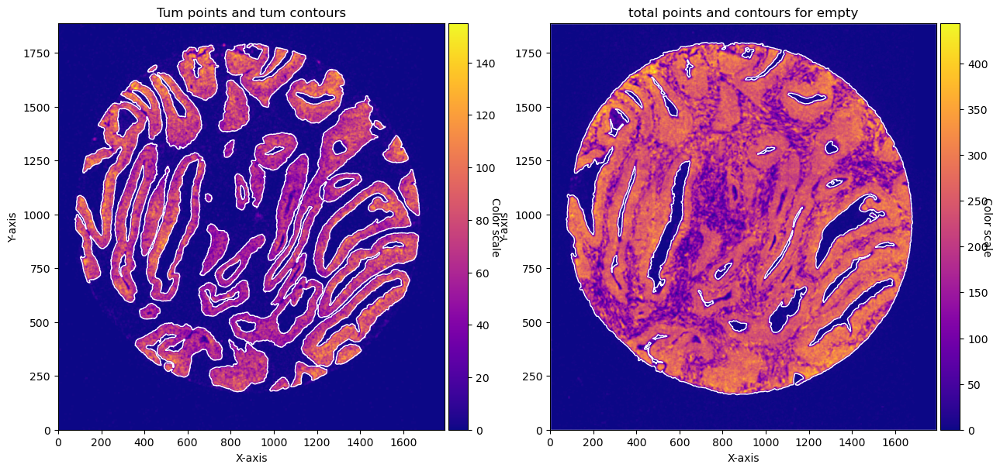

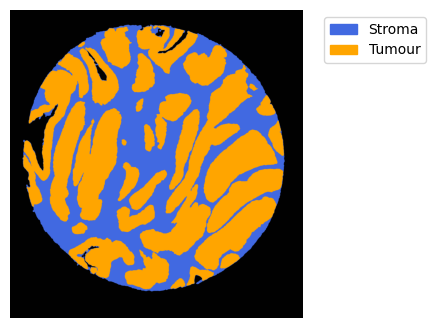

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 15/20 [02:41<00:49,  9.98s/it]

shape array: (1769, 1762, 480)
number of transcripts: 4048670
Function 'get_conv_sum' took 0.0772 seconds to execute.
Function 'contours_from_sum' took 1.5491 seconds to execute.
Function 'get_conv_sum' took 0.6027 seconds to execute.
Function 'contours_from_sum' took 1.6653 seconds to execute.


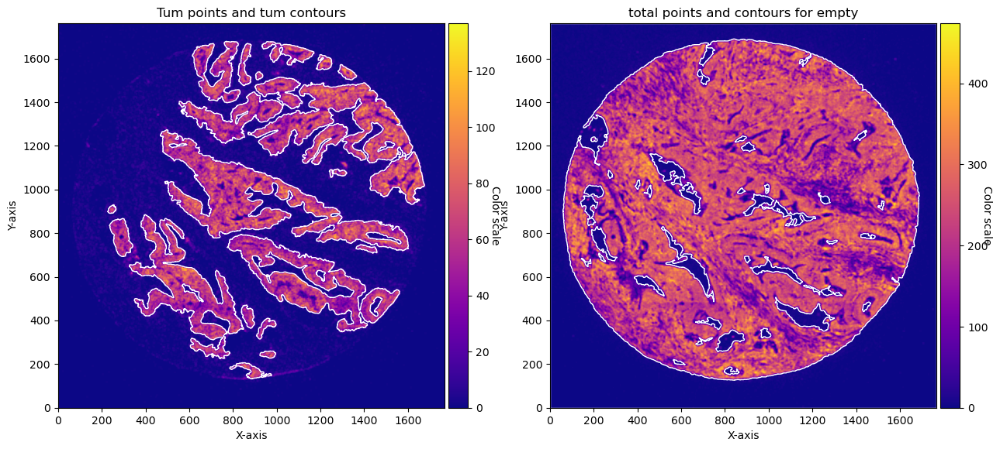

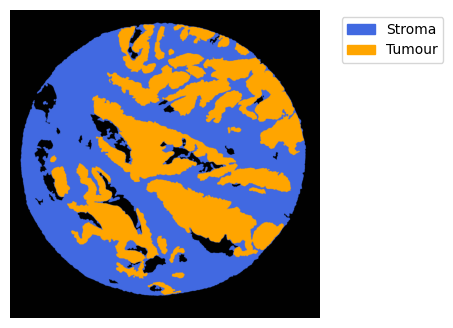

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 16/20 [02:51<00:40, 10.11s/it]

shape array: (1920, 1722, 480)
number of transcripts: 2894746
Function 'get_conv_sum' took 0.0787 seconds to execute.
Function 'contours_from_sum' took 1.8318 seconds to execute.
Function 'get_conv_sum' took 0.6252 seconds to execute.
Function 'contours_from_sum' took 3.9750 seconds to execute.


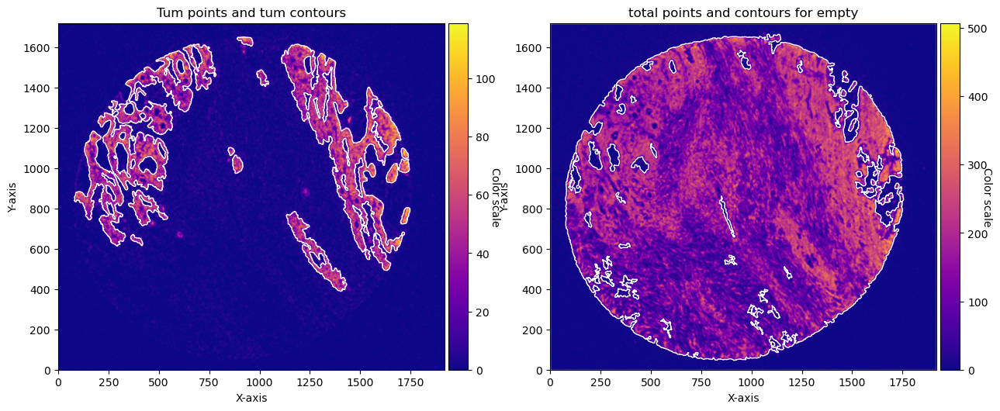

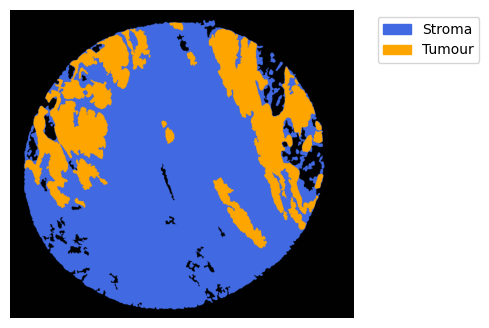

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 17/20 [03:03<00:31, 10.62s/it]

shape array: (1951, 1896, 479)
number of transcripts: 3166542
Function 'get_conv_sum' took 0.0877 seconds to execute.
Function 'contours_from_sum' took 2.3879 seconds to execute.
Function 'get_conv_sum' took 0.7539 seconds to execute.
Function 'contours_from_sum' took 3.2363 seconds to execute.


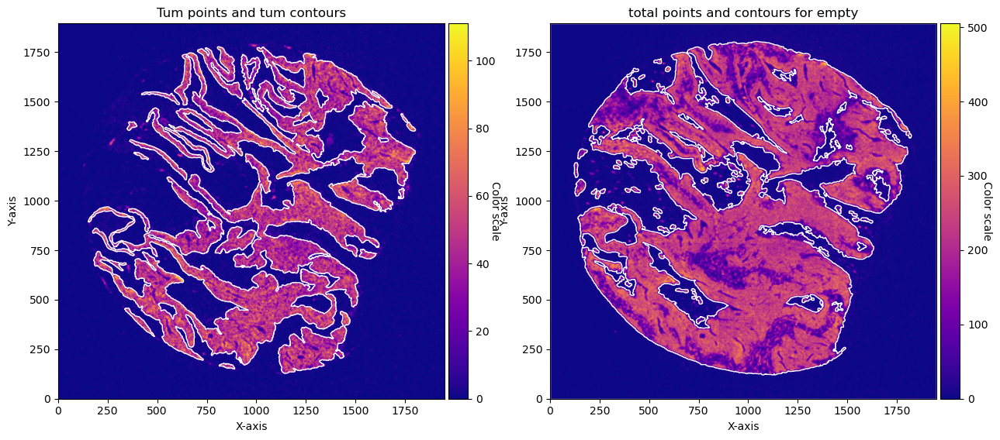

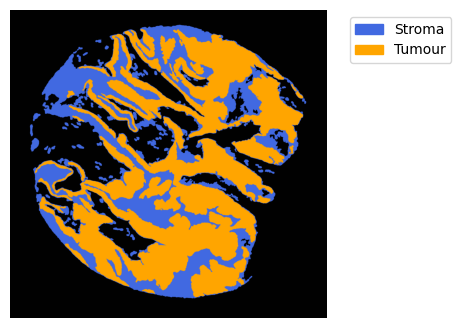

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 18/20 [03:15<00:22, 11.06s/it]/tmp/ipykernel_3010636/437774200.py:2: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df_total = pd.read_csv(file_csv)


shape array: (1732, 1738, 480)
number of transcripts: 2738148
Function 'get_conv_sum' took 0.0727 seconds to execute.
Function 'contours_from_sum' took 5.4067 seconds to execute.
Function 'get_conv_sum' took 0.5253 seconds to execute.
Function 'contours_from_sum' took 2.5426 seconds to execute.


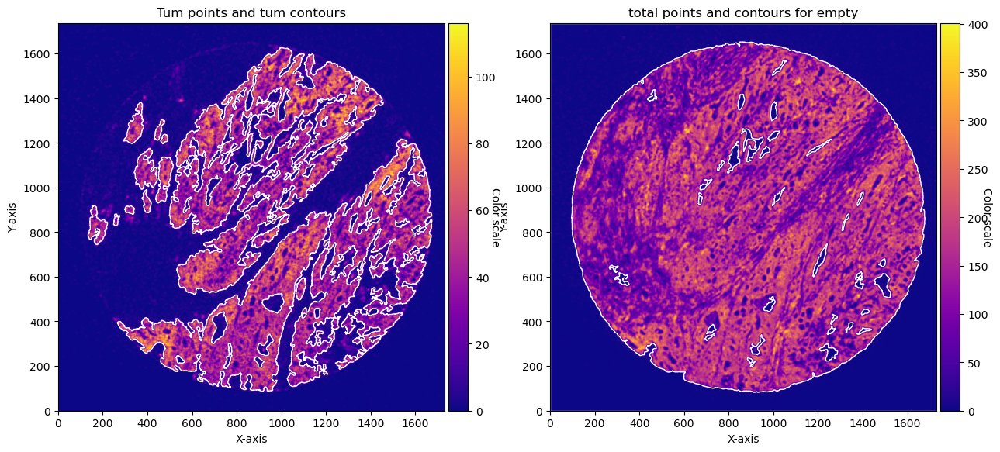

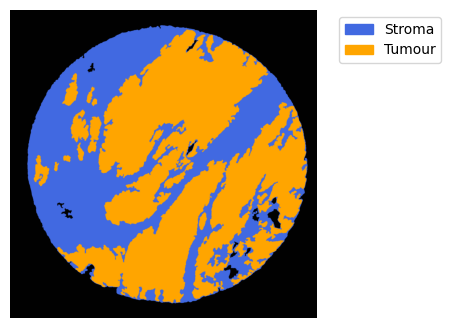

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 19/20 [03:29<00:11, 11.78s/it]

shape array: (1722, 1667, 480)
number of transcripts: 2623962
Function 'get_conv_sum' took 0.0687 seconds to execute.
Function 'contours_from_sum' took 4.9657 seconds to execute.
Function 'get_conv_sum' took 0.5325 seconds to execute.
Function 'contours_from_sum' took 3.0854 seconds to execute.


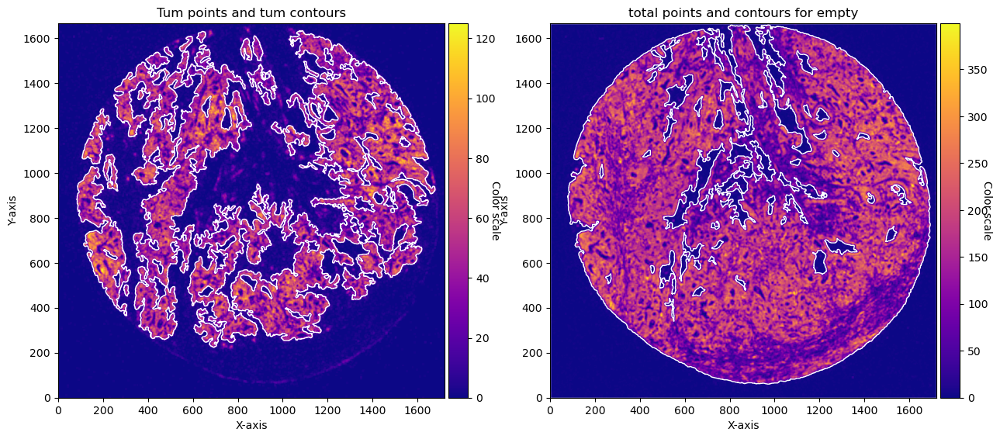

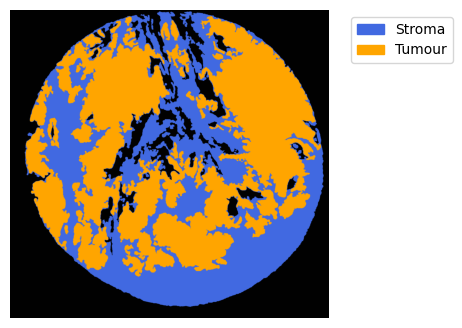

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:42<00:00, 11.12s/it]

CPU times: user 3min 37s, sys: 9.05 s, total: 3min 46s
Wall time: 3min 42s


In [10]:
%%time
for file_csv in tqdm(files_names):
    GM =  do_xenium_all(file_csv)